In [3]:
import cv2 #import OpenCV
from matplotlib import pyplot as plt #import matplotlib
import matplotlib.pyplot as plt
import numpy as np

In [4]:
def get_figsize(im):
    # What size does the figure need to be in inches to fit the image?
    dpi = plt.rcParams['figure.dpi']
    dim = im.shape
    figuresize = dim[1]/float(dpi), dim[0]/float(dpi)
    return(figuresize)

In [5]:
def display_image_actual_size_single(im_data):
    figuresize = get_figsize(im_data)
    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figuresize)
    # Add the single axis to fit the image to the screen boundary
    ax = fig.add_axes([0, 0, 1, 1])
    ax.imshow(im_data, cmap='gray')
    ax.axis('off')
    plt.show()
    return(fig)

In [6]:
def display_image_actual_size_double(im_data1,im_data2):
    # assuming that the two input images have the same dimension and shape
    # then, we calculate figsize from one of the two images
    figuresize = get_figsize(im_data1)
    # Create a figure of the right size that can accommodate two images side-by-side
    fig = plt.figure(figsize=(figuresize[0],figuresize[1]*2+.1))
    ax1 = fig.add_axes([0,0,1,1])
    ax1.imshow(im_data1, cmap='gray')
    ax1.axis('off')
    ax2 = fig.add_axes([1.1,0,1,1])
    ax2.imshow(im_data2, cmap='gray')
    ax2.axis('off')
    return(fig)

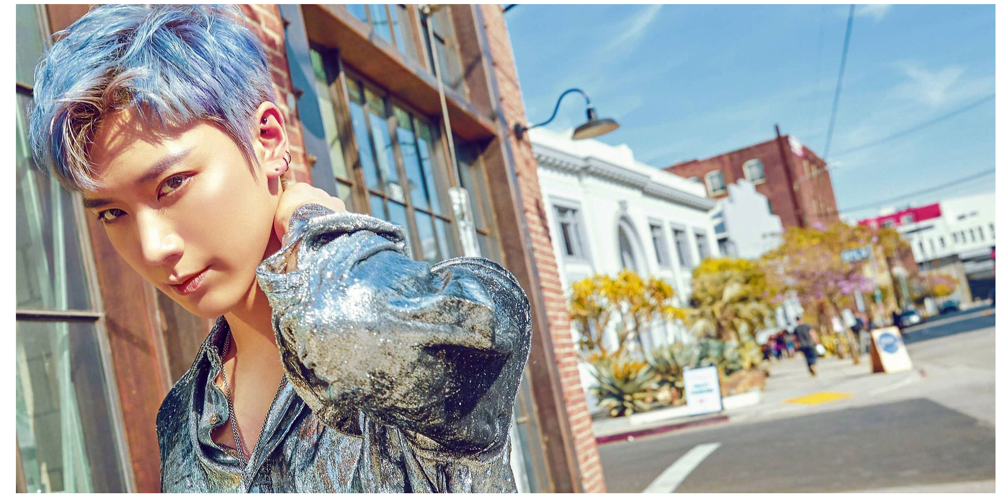

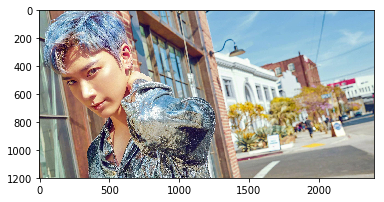

In [96]:
im = cv2.imread('ten.jpg')
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)

fig = display_image_actual_size_single(im)
plt.imshow(im)

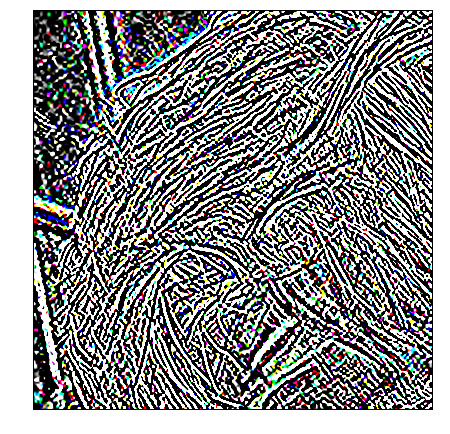

In [97]:
roi = im[0:400, 0:400]
sobeledgeHV = cv2.Sobel(roi, -1, 1, 1, ksize=7)   #vertical edges, changes in the x direction
fig = display_image_actual_size_single(sobeledgeHV)

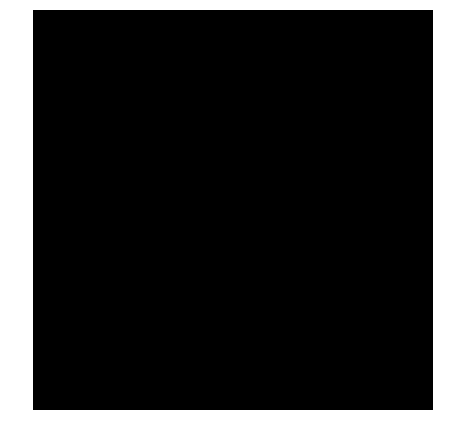

In [235]:
roi2 = im[0:400, 400:800]
roi2 = cv2.cvtColor(roi2, cv2.COLOR_BGR2GRAY)
weight = 100
darker = cv2.subtract(roi2,weight)
fig = display_image_actual_size_single(darker)

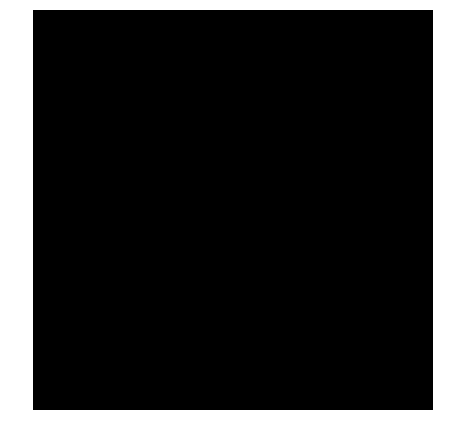

In [163]:
# Lower Contrast
roi3 = im[0:400, 800:1200]
weight = 100
lower = cv2.divide(8,roi3)
fig = display_image_actual_size_single(lower)

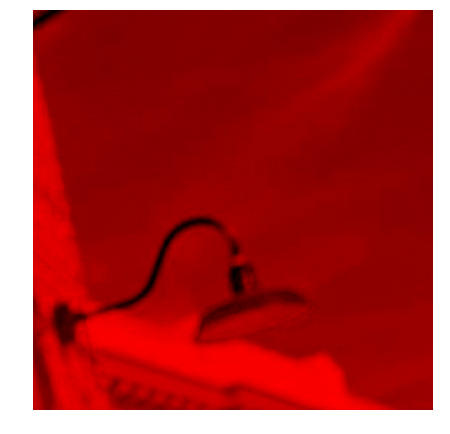

In [164]:
roi4 = im[0:400, 1200:1600]
onecolorR = roi4
onecolorR[:,:,1] = 0
onecolorR[:,:,2] = 0
fig = display_image_actual_size_single(roi4)

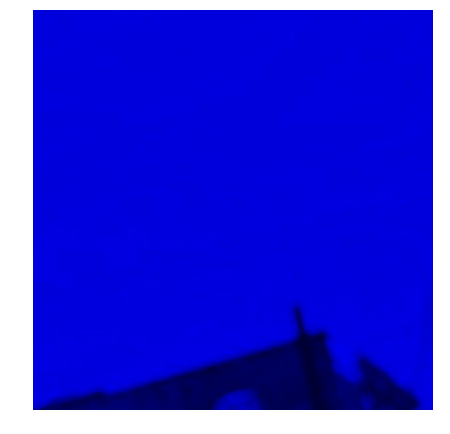

In [175]:
roi5 = im[0:400, 1600:2000]
onecolorB = roi5
onecolorB[:,:,0] = 0
onecolorB[:,:,1] = 0
fig = display_image_actual_size_single(roi5)

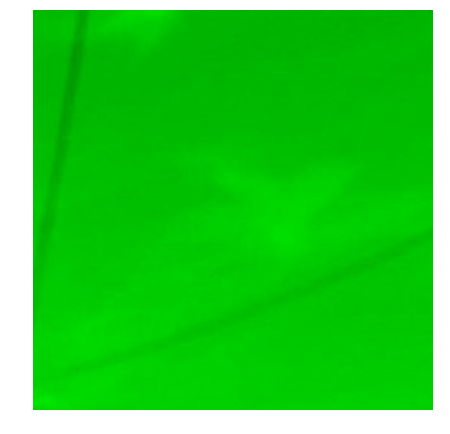

In [177]:
roi6 = im[0:400, 2000:2400]
onecolorG = roi6
onecolorG[:,:,0] = 0
onecolorG[:,:,2] = 0
fig = display_image_actual_size_single(roi6)

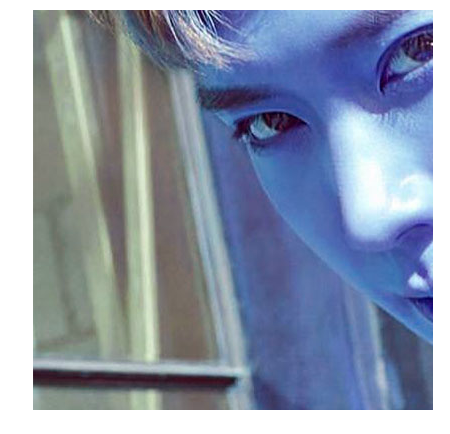

In [211]:
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
roi7 = im[400:800, 0:400]
fig = display_image_actual_size_single(roi7)

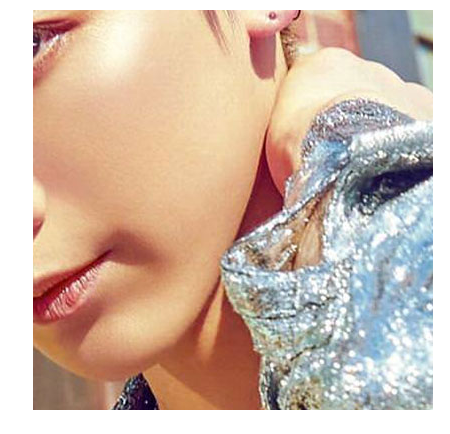

In [212]:
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
roi8 = im[400:800, 400:800]
fig = display_image_actual_size_single(roi8)

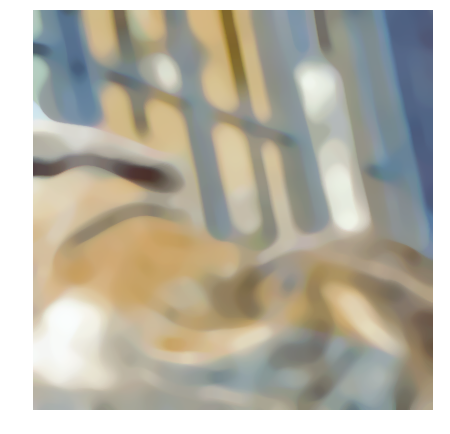

In [192]:
im9 = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
roi9 = im[400:800, 800:1200]
medianFiltered = cv2.medianBlur(roi9,15)  
roi9 = medianFiltered
fig = display_image_actual_size_single(roi9)

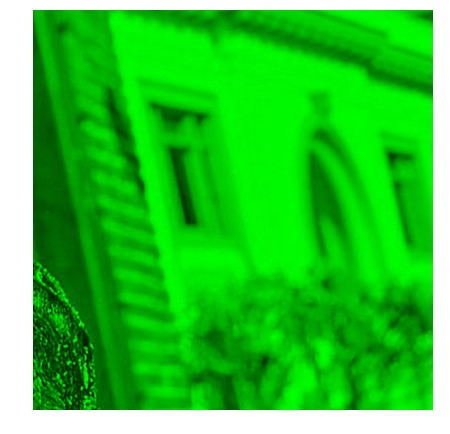

In [193]:
# Blue-Green
roi10 = im[400:800, 1200:1600]
onecolorBG = roi10
onecolorBG[:,:,0] = 0
fig = display_image_actual_size_single(roi10)

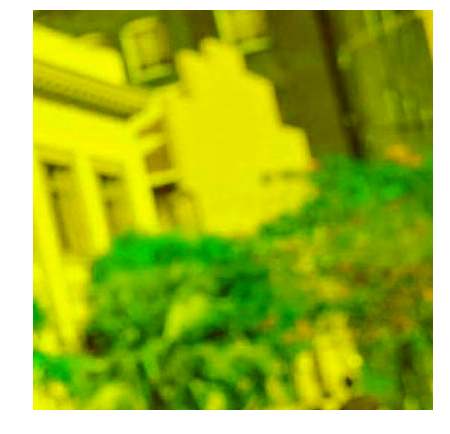

In [196]:
#Green-Red
roi11 = im[400:800, 1600:2000]
onecolorGR = roi11
onecolorGR[:,:,2] = 0
fig = display_image_actual_size_single(roi11)

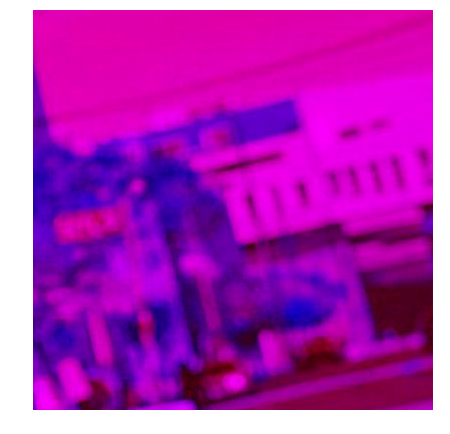

In [198]:
#Red-Blue
roi12 = im[400:800, 2000:2400]
onecolorRB = roi12
onecolorRB[:,:,1] = 0
fig = display_image_actual_size_single(roi12)

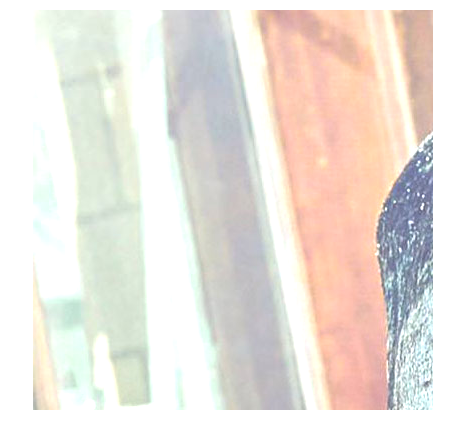

In [230]:
# im13 = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
roi13 = im[800:1200, 0:400]
weight = 100
brighter = np.ones(roi13.shape,dtype='uint8')
for i in np.arange(0,3):
    brighter[:,:,i] = cv2.add(roi13[:,:,i], weight)
white=brighter
fig = display_image_actual_size_single(white)

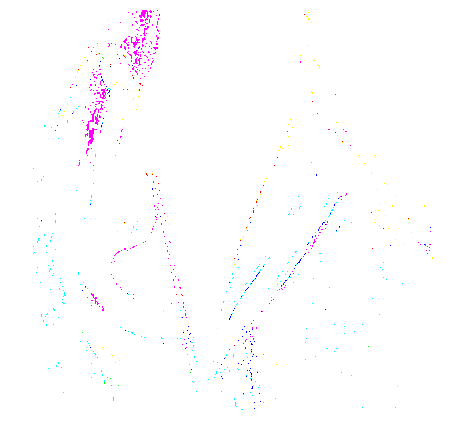

In [221]:
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
roi14 = im[800:1200, 400:800]
weight = 100
hight = np.ones(roi14.shape,dtype='uint8')
for i in np.arange(0,3):
    hight[:,:,i] = cv2.multiply(weight, roi14[:,:,i])
roi14=hight
fig = display_image_actual_size_single(roi14)

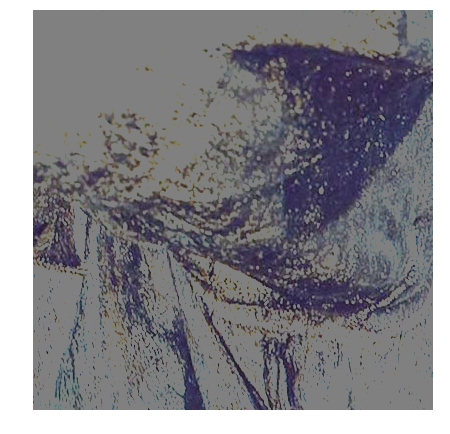

In [242]:
# negative
roi15 = im[800:1200, 800:1200]
weight = 128
negative = np.ones(roi15.shape,dtype='uint8')
for i in np.arange(0,3):
    negative[:,:,i] = cv2.subtract(weight, roi15[:,:,i])
roi15=negative
fig = display_image_actual_size_single(roi15)

In [244]:
def saltpepper_noise(image, prob):
    output = np.zeros(image.shape,np.uint8)
    thres = 1 - prob
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            rdn = np.random.random()
            if rdn < prob:
                output[i][j] = 0
            elif rdn > thres:
                output[i][j] = 255
            else:
                output[i][j] = image[i][j]
    return output

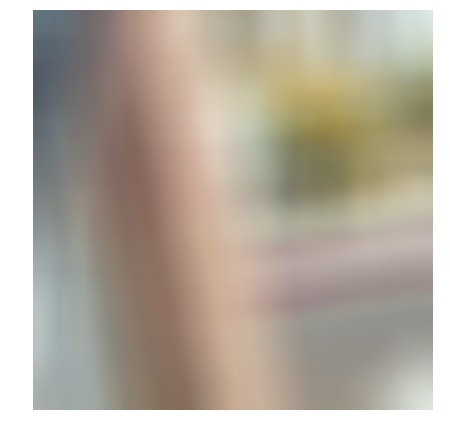

In [245]:
# Box Average

roi16 = im[800:1200, 1200:1600]
blurBox = cv2.boxFilter(roi16, -1, (75,75))
roi16=blurBox
fig = display_image_actual_size_single(roi16)

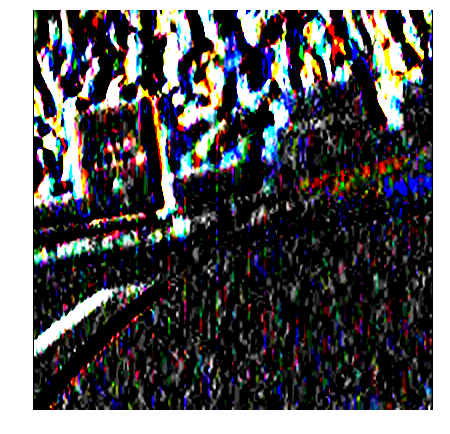

In [247]:
# Vertical Edges
roi17 = im[800:1200, 1600:2000]
sobeledgeV = cv2.Sobel(roi17, -1, 1, 0, ksize=5)
roi17 = sobeledgeV
fig = display_image_actual_size_single(roi17)

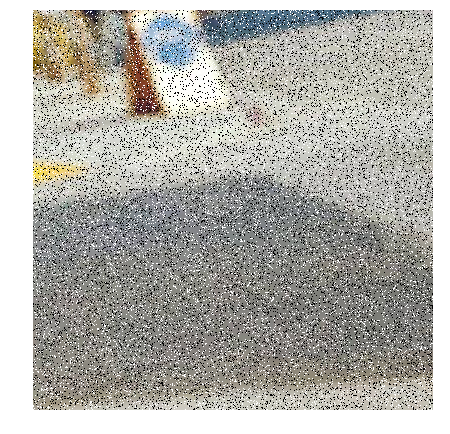

In [249]:
# Salt & Pepper Noise
roi18 = im[800:1200, 2000:2400]
imSP = saltpepper_noise(roi18,0.1)
roi18=imSP
fig = display_image_actual_size_single(roi18)

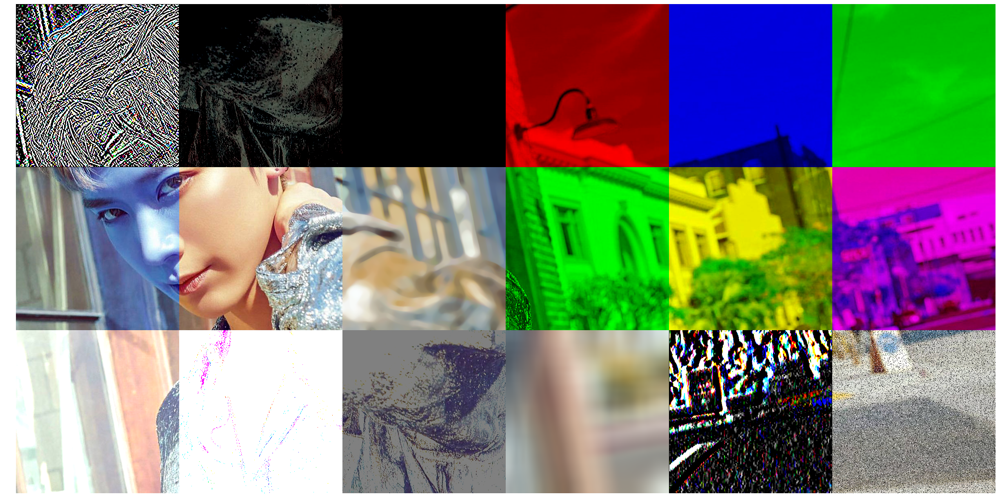

In [251]:
dst =sobeledgeHV
im[0:400,  0:400] = dst
re_con = roi2
im[0:400, 400:800,2] = re_con
low_con = lower
im[0:400, 800:1200] = low_con
red = roi4
im[0:400, 1200:1600] = red
blue = roi5
im[0:400, 1600:2000] = blue
green = roi6
im[0:400, 2000:2400] = green
nothing2 = roi7
im[400:800, 0:400] = nothing2
nothing = roi8
im[400:800, 400:800] = nothing
medianblur = roi9
im[400:800, 800:1200] = medianblur
bluegreen = roi10
im[400:800, 1200:1600] =bluegreen
greenred = roi11
im[400:800, 1600:2000] = greenred
redblue = roi12
im[400:800, 2000:2400] = redblue
brighterr = white
im[800:1200, 0:400] = brighterr
high_contrast = roi14
im[800:1200, 400:800] =high_contrast
negative = roi15
im[800:1200, 800:1200] = negative
blurbox = roi16
im[800:1200, 1200:1600] = blurbox
vedge = roi17
im[800:1200, 1600:2000] = vedge
sp = roi18
im[800:1200, 2000:2400] = sp
fig = display_image_actual_size_single(im)
fig.savefig("Project_MM.jpg", bbox_inches='tight')